In [18]:
import pandas as pd
# Load the dataset
data = pd.read_csv("FAANG - FAANG.csv")

# Display basic information
data.head()


,Company,Ticker,Date,Open,High,Low,Close,Adj Close,Volume,Market Cap,...,Price to Book Ratio,Enterprise Value,Total Debt,Total Assets,Total Equity,Beta (5Y),Annual Dividend Rate,Trailing Twelve Months (TTM) Revenue,Trailing Twelve Months (TTM) EBITDA,Trailing Twelve Months (TTM) Earnings
0,Apple,AAPL,1/3/2005,1.156786,1.162679,1.117857,1.130179,0.954409,691992000,3.580000e+12,...,53.66043,3.570000e+12,1.010000e+11,NaN,NaN,1.239,1.0,NaN,NaN,NaN
1,Apple,AAPL,1/4/2005,1.139107,1.169107,1.124464,1.141786,0.964210,1096810400,3.580000e+12,...,53.66043,3.570000e+12,1.010000e+11,NaN,NaN,1.239,1.0,NaN,NaN,NaN
2,Apple,AAPL,1/5/2005,1.151071,1.165179,1.143750,1.151786,0.972655,680433600,3.580000e+12,...,53.66043,3.570000e+12,1.010000e+11,NaN,NaN,1.239,1.0,NaN,NaN,NaN
3,Apple,AAPL,1/6/2005,1.154821,1.159107,1.130893,1.152679,0.973409,705555200,3.580000e+12,...,53.66043,3.570000e+12,1.010000e+11,NaN,NaN,1.239,1.0,NaN,NaN,NaN
4,Apple,AAPL,1/7/2005,1.160714,1.243393,1.156250,1.236607,1.044284,2227450400,3.580000e+12,...,53.66043,3.570000e+12,1.010000e+11,NaN,NaN,1.239,1.0,NaN,NaN,NaN


In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23055 entries, 0 to 23054
Data columns (total 41 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Company                                23055 non-null  object 
 1   Ticker                                 23055 non-null  object 
 2   Date                                   23055 non-null  object 
 3   Open                                   23055 non-null  float64
 4   High                                   23055 non-null  float64
 5   Low                                    23055 non-null  float64
 6   Close                                  23055 non-null  float64
 7   Adj Close                              23055 non-null  float64
 8   Volume                                 23055 non-null  int64  
 9   Market Cap                             23055 non-null  float64
 10  PE Ratio                               23055 non-null  float64
 11  Be

In [20]:
data['Volume'] = pd.to_numeric(data['Volume'], errors='coerce')  # Converts invalid entries to NaN
#converting volume to float64
data['Volume'] = data['Volume'].astype('float64')

data['Volume'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 23055 entries, 0 to 23054
Series name: Volume
Non-Null Count  Dtype  
--------------  -----  
23055 non-null  float64
dtypes: float64(1)
memory usage: 180.2 KB


In [21]:
# Check for missing values
data.isnull().sum()


Company                                      0
Ticker                                       0
Date                                         0
Open                                         0
High                                         0
Low                                          0
Close                                        0
Adj Close                                    0
Volume                                       0
Market Cap                                   0
PE Ratio                                     0
Beta                                      4982
EPS                                          0
Forward PE                                   0
Revenue                                  23055
Gross Profit                             23055
Operating Income                         23055
Net Income                                   0
Debt to Equity                               0
Return on Equity (ROE)                       0
Current Ratio                                0
Dividends Pai

In [22]:
# Calculating the percentage of missing value
missing_percentage = data.isnull().sum() / len(data) * 100

# Drop the column exceeding the missing value
columns_to_drop = missing_percentage[missing_percentage > 40].index
data = data.drop(columns= columns_to_drop , axis= 1)
print("dropped columns:")
print(columns_to_drop)


dropped columns:
Index(['Revenue', 'Gross Profit', 'Operating Income', 'Dividends Paid',
       'Dividend Yield', 'Cash Ratio', 'Total Assets', 'Total Equity',
       'Annual Dividend Rate', 'Trailing Twelve Months (TTM) Revenue',
       'Trailing Twelve Months (TTM) EBITDA',
       'Trailing Twelve Months (TTM) Earnings'],
      dtype='object')


In [23]:
# Checking after the columns are dropped
data.columns

Index(['Company', 'Ticker', 'Date', 'Open', 'High', 'Low', 'Close',
       'Adj Close', 'Volume', 'Market Cap', 'PE Ratio', 'Beta', 'EPS',
       'Forward PE', 'Net Income', 'Debt to Equity', 'Return on Equity (ROE)',
       'Current Ratio', 'Quarterly Revenue Growth', 'Analyst Recommendation',
       'Target Price', 'Free Cash Flow', 'Operating Margin', 'Profit Margin',
       'Quick Ratio', 'Price to Book Ratio', 'Enterprise Value', 'Total Debt',
       'Beta (5Y)'],
      dtype='object')

In [24]:
# List of columns to keep
columns_to_keep = ['Open', 'High', 'Low', 'Volume', 'Adj Close', 'Market Cap', 'Ticker', 'Close','Date']

# Drop unnecessary columns
data = data[columns_to_keep]

# Check the updated dataset
data.head()

,Open,High,Low,Volume,Adj Close,Market Cap,Ticker,Close,Date
0,1.156786,1.162679,1.117857,6.919920e+08,0.954409,3.580000e+12,AAPL,1.130179,1/3/2005
1,1.139107,1.169107,1.124464,1.096810e+09,0.964210,3.580000e+12,AAPL,1.141786,1/4/2005
2,1.151071,1.165179,1.143750,6.804336e+08,0.972655,3.580000e+12,AAPL,1.151786,1/5/2005
3,1.154821,1.159107,1.130893,7.055552e+08,0.973409,3.580000e+12,AAPL,1.152679,1/6/2005
4,1.160714,1.243393,1.156250,2.227450e+09,1.044284,3.580000e+12,AAPL,1.236607,1/7/2005


In [25]:
data.isnull().sum()

Open          0
High          0
Low           0
Volume        0
Adj Close     0
Market Cap    0
Ticker        0
Close         0
Date          0
dtype: int64

In [26]:
import numpy as np

#Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

#Extract time-based features from 'Date'
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day
data['Day_of_Week'] = data['Date'].dt.dayofweek  # 0 = Monday, 6 = Sunday
data['Quarter'] = data['Date'].dt.quarter

# Encode 'Month' and 'Day_of_Week' as cyclic features
data['Month_Sin'] = np.sin(2 * np.pi * data['month'] / 12)
data['Month_Cos'] = np.cos(2 * np.pi * data['month'] / 12)
data['Day_of_Week_Sin'] = np.sin(2 * np.pi * data['Day_of_Week'] / 7)
data['Day_of_Week_Cos'] = np.cos(2 * np.pi * data['Day_of_Week'] / 7)

# Ensure the dataset is sorted by time for time-series integrity
data.sort_values(by=['year', 'month', 'day'], inplace=True)

# Reset index for consistency
data.reset_index(drop=True, inplace=True)

In [27]:
data.head()

,Open,High,Low,Volume,Adj Close,Market Cap,Ticker,Close,Date,year,month,day,Day_of_Week,Quarter,Month_Sin,Month_Cos,Day_of_Week_Sin,Day_of_Week_Cos
0,1.156786,1.162679,1.117857,6.919920e+08,0.954409,3.580000e+12,AAPL,1.130179,2005-01-03,2005,1,3,0,1,0.5,0.866025,0.000000,1.00000
1,4.939940,5.096096,4.891391,6.331342e+08,5.060293,2.020000e+12,GOOGL,5.072823,2005-01-03,2005,1,3,0,1,0.5,0.866025,0.000000,1.00000
2,2.247500,2.272000,2.210500,2.089300e+08,2.226000,2.000000e+12,AMZN,2.226000,2005-01-03,2005,1,3,0,1,0.5,0.866025,0.000000,1.00000
3,1.800000,1.800000,1.645714,1.133440e+07,1.702857,3.250000e+11,NFLX,1.702857,2005-01-03,2005,1,3,0,1,0.5,0.866025,0.000000,1.00000
4,1.139107,1.169107,1.124464,1.096810e+09,0.964210,3.580000e+12,AAPL,1.141786,2005-01-04,2005,1,4,1,1,0.5,0.866025,0.781831,0.62349


In [28]:
df_encoded = pd.get_dummies(data['Ticker'], prefix='Ticker',drop_first = True)

In [29]:
#add the results to the original dataframe

data = pd.concat([data,df_encoded],axis= 1 )

In [30]:
data.drop(['Ticker'],axis = 1 , inplace = True )
data.head()

,Open,High,Low,Volume,Adj Close,Market Cap,Close,Date,year,month,...,Day_of_Week,Quarter,Month_Sin,Month_Cos,Day_of_Week_Sin,Day_of_Week_Cos,Ticker_AMZN,Ticker_GOOGL,Ticker_META,Ticker_NFLX
0,1.156786,1.162679,1.117857,6.919920e+08,0.954409,3.580000e+12,1.130179,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,False,False,False,False
1,4.939940,5.096096,4.891391,6.331342e+08,5.060293,2.020000e+12,5.072823,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,False,True,False,False
2,2.247500,2.272000,2.210500,2.089300e+08,2.226000,2.000000e+12,2.226000,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,True,False,False,False
3,1.800000,1.800000,1.645714,1.133440e+07,1.702857,3.250000e+11,1.702857,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,False,False,False,True
4,1.139107,1.169107,1.124464,1.096810e+09,0.964210,3.580000e+12,1.141786,2005-01-04,2005,1,...,1,1,0.5,0.866025,0.781831,0.62349,False,False,False,False


In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23055 entries, 0 to 23054
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Open             23055 non-null  float64       
 1   High             23055 non-null  float64       
 2   Low              23055 non-null  float64       
 3   Volume           23055 non-null  float64       
 4   Adj Close        23055 non-null  float64       
 5   Market Cap       23055 non-null  float64       
 6   Close            23055 non-null  float64       
 7   Date             23055 non-null  datetime64[ns]
 8   year             23055 non-null  int32         
 9   month            23055 non-null  int32         
 10  day              23055 non-null  int32         
 11  Day_of_Week      23055 non-null  int32         
 12  Quarter          23055 non-null  int32         
 13  Month_Sin        23055 non-null  float64       
 14  Month_Cos        23055 non-null  float

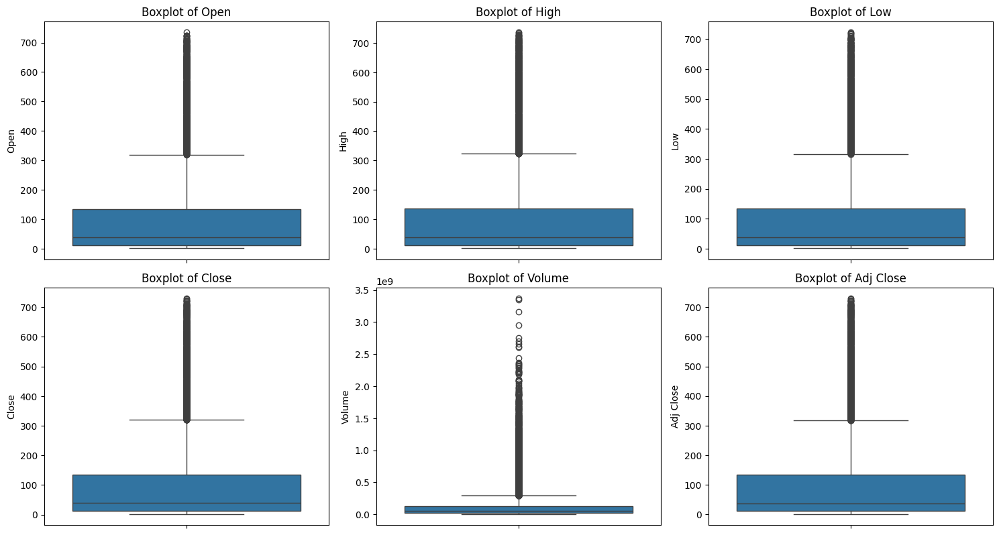

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Columns to visualize
columns_to_plot = ['Open', 'High', 'Low', 'Close', 'Volume','Adj Close']

# Create subplots
plt.figure(figsize=(15, 12))
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(3, 3, i)  # Adjusted to 3 rows and 3 columns to accommodate all plots
    sns.boxplot(y=column, data=data)
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()


In [16]:
# # Columns to check for outliers
# columns_to_check = ["Open", "High", "Low", "Close", "Volume"]

# def remove_outliers_iqr(df, column):
#     """
#     Removes outliers based on IQR method
#     """
#     Q1 = df[column].quantile(0.25)
#     Q3 = df[column].quantile(0.75)
#     IQR = Q3 - Q1
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR
#     return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# # Create a copy of the original data
# filtered_data = data.copy()

# # Remove outliers from Close price first since it's the target
# filtered_data = remove_outliers_iqr(filtered_data, 'Close')

# # Then remove outliers from other columns
# for col in columns_to_check:
#     if col != 'Close':
#         filtered_data = remove_outliers_iqr(filtered_data, col)

# # Compare original and filtered data sizes
# original_size = data.shape[0]
# filtered_size = filtered_data.shape[0]

# print(f"Original dataset size: {original_size}")
# print(f"Filtered dataset size: {filtered_size}")
# print(f"Number of rows removed: {original_size - filtered_size}")

In [33]:
# Columns to apply IQR-based outlier handling
columns_to_check = ["Open", "High", "Low", "Close", "Volume", "Adj Close"]

def clip_outliers_iqr(df, column):
    """
    Clips outliers to IQR boundaries 
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Clip values to IQR bounds
    return df[column].clip(lower=lower_bound, upper=upper_bound)

# Create a copy for clipping
clipped_data = data.copy()

# Apply IQR clipping to all specified columns
for col in columns_to_check:
    clipped_data[col] = clip_outliers_iqr(clipped_data, col)

# Compare data sizes and show sample of changes
print(f"Dataset shape: {clipped_data.shape}")
print("\nNumber of modified values in each column:")
for col in columns_to_check:
    num_modified = (data[col] != clipped_data[col]).sum()
    print(f"{col}: {num_modified} values clipped")


Dataset shape: (23055, 21)

Number of modified values in each column:
Open: 1690 values clipped
High: 1703 values clipped
Low: 1674 values clipped
Close: 1687 values clipped
Volume: 2781 values clipped
Adj Close: 1695 values clipped


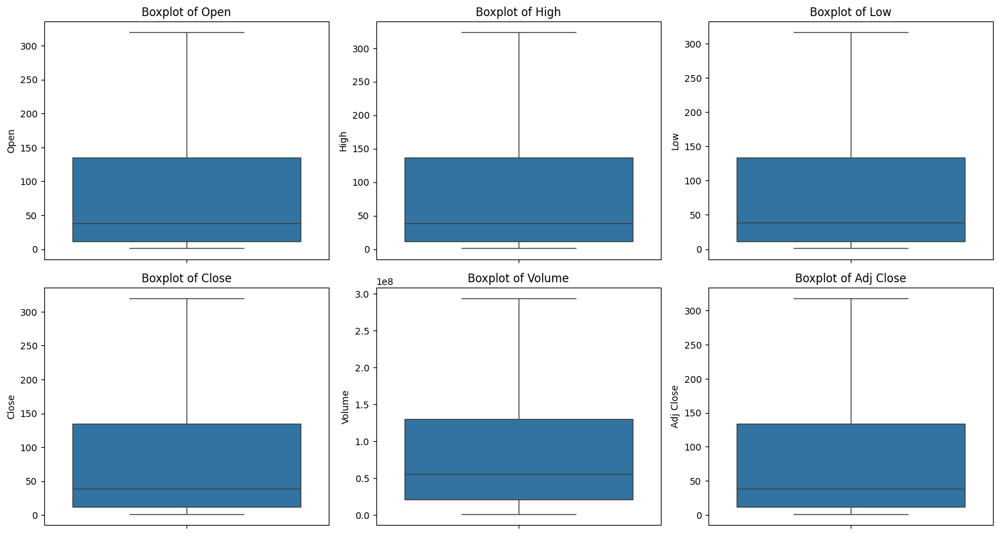

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Columns to visualize
columns_to_plot = ['Open', 'High', 'Low', 'Close', 'Volume','Adj Close']

# Create subplots
plt.figure(figsize=(15, 12))
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(3, 3, i)  # Adjusted to 3 rows and 3 columns to accommodate all plots
    sns.boxplot(y=column, data= clipped_data)
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()


In [35]:
clipped_data.describe()

,Open,High,Low,Volume,Adj Close,Market Cap,Close,Date,year,month,day,Day_of_Week,Quarter,Month_Sin,Month_Cos,Day_of_Week_Sin,Day_of_Week_Cos
count,23055.000000,23055.000000,23055.000000,2.305500e+04,23055.000000,2.305500e+04,23055.000000,23055,23055.000000,23055.00000,23055.000000,23055.000000,23055.000000,2.305500e+04,2.305500e+04,23055.000000,23055.000000
mean,83.776867,84.842436,82.767728,9.345434e+07,83.266273,1.912023e+12,83.823467,2015-05-26 16:14:03.201041152,2014.901106,6.50887,15.717415,2.024984,2.502754,-8.832887e-03,-1.960982e-02,0.361242,-0.094026
min,1.139107,1.159107,1.117857,1.144000e+06,0.954409,3.250000e+11,1.130179,2005-01-03 00:00:00,2005.000000,1.00000,1.000000,0.000000,1.000000,-1.000000e+00,-1.000000e+00,-0.433884,-0.900969
25%,11.728979,11.864486,11.587829,2.131500e+07,11.366614,1.470000e+12,11.720929,2010-09-22 12:00:00,2010.000000,4.00000,8.000000,1.000000,2.000000,-8.660254e-01,-8.660254e-01,0.000000,-0.900969
50%,38.584999,38.983002,38.297501,5.576380e+07,38.050781,2.000000e+12,38.598499,2015-08-21 00:00:00,2015.000000,7.00000,16.000000,2.000000,3.000000,-2.449294e-16,-1.836970e-16,0.433884,-0.222521
75%,134.849998,136.550003,133.449997,1.302896e+08,134.173950,2.020000e+12,134.970001,2020-03-20 00:00:00,2020.000000,9.00000,23.000000,3.000000,3.000000,5.000000e-01,5.000000e-01,0.781831,0.623490
max,319.531527,323.578279,316.243249,2.937515e+08,318.384955,3.580000e+12,319.843610,2024-10-18 00:00:00,2024.000000,12.00000,31.000000,4.000000,4.000000,1.000000e+00,1.000000e+00,0.974928,1.000000
std,95.745328,97.025752,94.613871,9.471904e+07,95.634819,1.084576e+12,95.823935,NaN,5.619111,3.40576,8.748959,1.398633,1.108881,7.095089e-01,7.043989e-01,0.515724,0.771187


In [36]:
# # Calculate and append median and mode to the descriptive statistics
# clipped_data.loc['median'] = clipped_data.median()
# clipped_data.loc['mode'] = clipped_data.mode().iloc[0]
# clipped_data.tail()
clipped_data.head()

,Open,High,Low,Volume,Adj Close,Market Cap,Close,Date,year,month,...,Day_of_Week,Quarter,Month_Sin,Month_Cos,Day_of_Week_Sin,Day_of_Week_Cos,Ticker_AMZN,Ticker_GOOGL,Ticker_META,Ticker_NFLX
0,1.156786,1.162679,1.117857,293751500.0,0.954409,3.580000e+12,1.130179,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,False,False,False,False
1,4.939940,5.096096,4.891391,293751500.0,5.060293,2.020000e+12,5.072823,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,False,True,False,False
2,2.247500,2.272000,2.210500,208930000.0,2.226000,2.000000e+12,2.226000,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,True,False,False,False
3,1.800000,1.800000,1.645714,11334400.0,1.702857,3.250000e+11,1.702857,2005-01-03,2005,1,...,0,1,0.5,0.866025,0.000000,1.00000,False,False,False,True
4,1.139107,1.169107,1.124464,293751500.0,0.964210,3.580000e+12,1.141786,2005-01-04,2005,1,...,1,1,0.5,0.866025,0.781831,0.62349,False,False,False,False


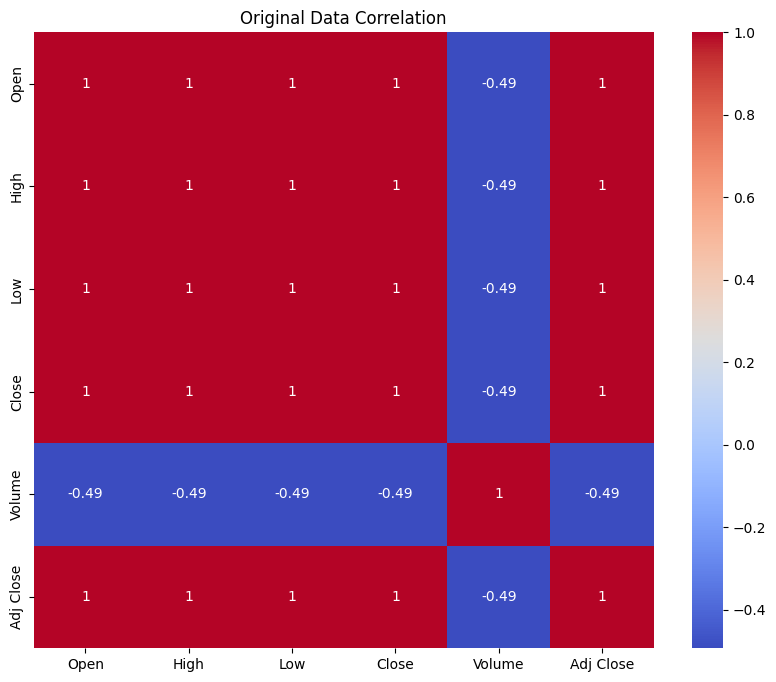

In [37]:
plt.figure(figsize=(10, 8))
sns.heatmap(clipped_data[["Open", "High", "Low", "Close", "Volume","Adj Close"]].corr(), 
            annot=True, 
            cmap='coolwarm')
plt.title('Original Data Correlation')
plt.show()

In [38]:
clipped_data.columns

Index(['Open', 'High', 'Low', 'Volume', 'Adj Close', 'Market Cap', 'Close',
       'Date', 'year', 'month', 'day', 'Day_of_Week', 'Quarter', 'Month_Sin',
       'Month_Cos', 'Day_of_Week_Sin', 'Day_of_Week_Cos', 'Ticker_AMZN',
       'Ticker_GOOGL', 'Ticker_META', 'Ticker_NFLX'],
      dtype='object')

In [39]:
import plotly.graph_objs as go
import plotly.express as px

# Create traces
fig = go.Figure()

fig.add_trace(go.Scatter(x=clipped_data['Date'], y=clipped_data['Close'], mode='lines', name='Close Price'))
fig.add_trace(go.Scatter(x=clipped_data['Date'], y=clipped_data['Open'], mode='lines', name='Open Price', opacity=0.7))
fig.add_trace(go.Scatter(x=clipped_data['Date'], y=clipped_data['High'], mode='lines', name='High Price', opacity=0.7))
fig.add_trace(go.Scatter(x=clipped_data['Date'], y=clipped_data['Low'], mode='lines', name='Low Price', opacity=0.7))

# Update layout
fig.update_layout(
    title='Stock Prices Over Time',
    xaxis_title='Date',
    yaxis_title='Price',
    hovermode='x unified',
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ),
)

fig.show()


In [66]:
# Scatter plot for Open vs. Volume
fig_open = px.scatter(clipped_data, x='Volume', y='Open', title='Open Price vs. Volume', labels={'Volume': 'Volume', 'Open': 'Open Price'}, opacity=0.7)
fig_open.show()

# Scatter plot for High vs. Volume
fig_high = px.scatter(clipped_data, x='Volume', y='High', title='High Price vs. Volume', labels={'Volume': 'Volume', 'High': 'High Price'}, opacity=0.7)
fig_high.show()

# Scatter plot for Low vs. Volume
fig_low = px.scatter(clipped_data, x='Volume', y='Low', title='Low Price vs. Volume', labels={'Volume': 'Volume', 'Low': 'Low Price'}, opacity=0.7)
fig_low.show()

# Scatter plot for Close vs. Volume
fig_close = px.scatter(clipped_data, x='Volume', y='Close', title='Close Price vs. Volume', labels={'Volume': 'Volume', 'Close': 'Close Price'}, opacity=0.7)
fig_close.show()


In [65]:
# Scatter plot for Close vs. Volume
fig_close_volume = px.scatter(clipped_data, x='Volume', y='Close', title='Close Price vs. Volume', labels={'Volume': 'Volume', 'Close': 'Close Price'}, opacity=0.7)
fig_close_volume.show()

# Scatter plot for Close vs. Open
fig_close_open = px.scatter(clipped_data, x='Open', y='Close', title='Close Price vs. Open Price', labels={'Open': 'Open Price', 'Close': 'Close Price'}, opacity=0.7)
fig_close_open.show()

# Scatter plot for Close vs. High
fig_close_high = px.scatter(clipped_data, x='High', y='Close', title='Close Price vs. High Price', labels={'High': 'High Price', 'Close': 'Close Price'}, opacity=0.7)
fig_close_high.show()

# Scatter plot for Close vs. Low
fig_close_low = px.scatter(clipped_data, x='Low', y='Close', title='Close Price vs. Low Price', labels={'Low': 'Low Price', 'Close': 'Close Price'}, opacity=0.7)
fig_close_low.show()


In [40]:
# Display correlations of features with 'Close' price
corr_with_close = clipped_data['Close'].sort_values(ascending=False)
corr_with_close

23028    319.843610
23026    319.843610
23033    319.843610
23053    319.843610
23023    319.843610
            ...    
24         1.152857
12         1.152679
8          1.151786
4          1.141786
0          1.130179
Name: Close, Length: 23055, dtype: float64

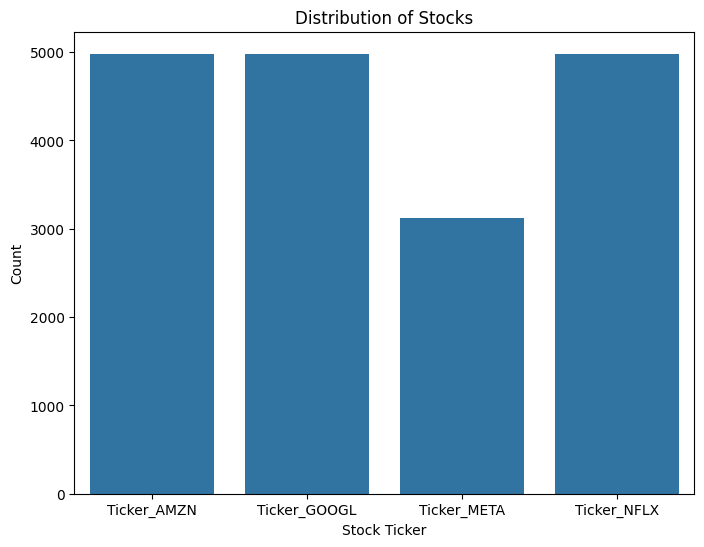

In [41]:
# Distribution of different tickers
tickers = ['Ticker_AMZN', 'Ticker_GOOGL', 'Ticker_META', 'Ticker_NFLX']
ticker_counts = clipped_data[tickers].sum()

plt.figure(figsize=(8, 6))
sns.barplot(x=ticker_counts.index, y=ticker_counts.values)
plt.title('Distribution of Stocks')
plt.xlabel('Stock Ticker')
plt.ylabel('Count')
plt.show()


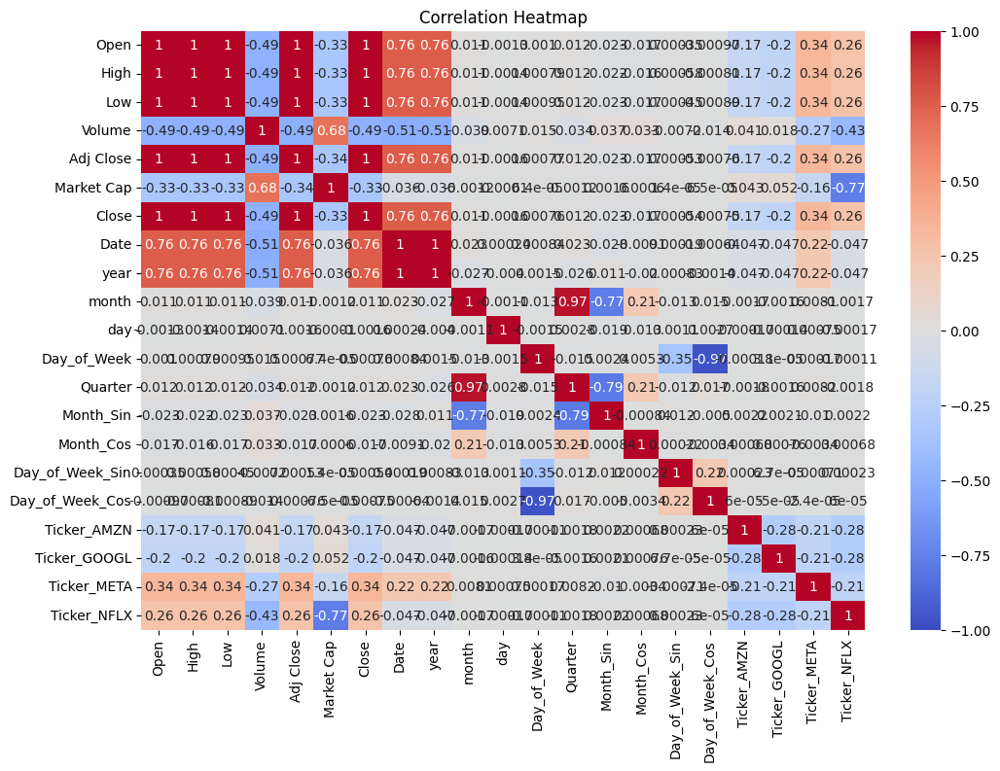

In [29]:
# Plot the correlation matrix
corr = clipped_data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

In [42]:
import pandas as pd
from sklearn.model_selection import train_test_split


clipped_data['Log_Close'] = np.log(clipped_data['Close']) 
# Features and target 
X = clipped_data[['Open', 'High', 'Low', 'Volume','Day_of_Week','Ticker_AMZN','Ticker_GOOGL','Ticker_NFLX']] 
y = clipped_data['Log_Close'] # Use the log-transformed target variable
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the split sizes
print("Training set size:", X_train.shape, y_train.shape)
print("Testing set size:", X_test.shape, y_test.shape)




Training set size: (18444, 8) (18444,)
Testing set size: (4611, 8) (4611,)


In [43]:
# Normalize the data for Regularization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert the scaled data back to DataFrames for easier inspection
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

# Verify the scaling
X_train_scaled_df.head()




,Open,High,Low,Volume,Day_of_Week,Ticker_AMZN,Ticker_GOOGL,Ticker_NFLX
17892,0.323727,0.315290,0.289890,0.916454,1.411540,-0.523554,-0.530944,-0.523386
15448,0.815067,0.800550,0.804644,-0.607617,-0.730096,-0.523554,-0.530944,-0.523386
4699,-0.809249,-0.807756,-0.810556,-0.871497,-0.730096,-0.523554,-0.530944,1.910636
3948,-0.840365,-0.837713,-0.839973,2.104432,-0.016217,-0.523554,-0.530944,-0.523386
2207,-0.843113,-0.841997,-0.842844,-0.900321,-0.016217,-0.523554,-0.530944,1.910636


In [44]:
X_test_scaled_df.head()

,Open,High,Low,Volume,Day_of_Week,Ticker_AMZN,Ticker_GOOGL,Ticker_NFLX
10690,-0.718574,-0.717660,-0.717239,0.846176,1.411540,1.910022,-0.530944,-0.523386
19340,0.855515,0.877552,0.870281,-0.271789,-0.016217,1.910022,-0.530944,-0.523386
12331,0.204367,0.232677,0.207500,-0.855902,-0.730096,-0.523554,-0.530944,1.910636
12038,0.135177,0.131602,0.119821,-0.660577,-0.730096,-0.523554,-0.530944,-0.523386
2359,-0.840753,-0.840126,-0.840427,-0.926361,-0.730096,-0.523554,-0.530944,1.910636


In [32]:
# from sklearn.decomposition import PCA

# # Step 1: PCA for Dimensionality Reduction
# pca = PCA(n_components=3)  # Reduce to 3 principal components
# X_train_pca = pca.fit_transform(X_train_scaled)
# X_test_pca = pca.transform(X_test_scaled)

In [45]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score


# Initialize the model
model = LinearRegression()

# Fit the model
model.fit(X_train_scaled, y_train)



LinearRegression()

In [46]:
# Make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Calculate accuracy (R-squared)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Calculate Mean Squared Error
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

# Print the results
print(f"Training R^2: {train_r2:.3f}")
print(f"Testing R^2: {test_r2:.3f}")
print(f"Training MSE: {train_mse:.3f}")
print(f"Testing MSE: {test_mse:.3f}")

# Perform k-fold cross-validation
cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print(f"Cross-Validation R^2 Scores: {cv_scores}")
print(f"Mean Cross-Validation R^2 Score: {cv_scores.mean():.3f}")

Training R^2: 0.797
Testing R^2: 0.794
Training MSE: 0.457
Testing MSE: 0.469
Cross-Validation R^2 Scores: [0.7977432  0.79812067 0.791449   0.79901423 0.79968345]
Mean Cross-Validation R^2 Score: 0.797


In [47]:
from sklearn.linear_model import Ridge, Lasso

# Apply Ridge and Lasso Regression
ridge = Ridge(alpha=1.0)
lasso = Lasso(alpha=0.1)

# Train Ridge Model
ridge.fit(X_train_scaled, y_train)





Ridge()

In [48]:
# Predictions
ridge_preds = ridge.predict(X_test_scaled)
# Metrics for Ridge
ridge_r2 = r2_score(y_test, ridge_preds)
ridge_mse = mean_squared_error(y_test, ridge_preds)
print("Ridge Regression")
print(f"R^2: {ridge_r2:.4f}, MSE: {ridge_mse:.4f}")


Ridge Regression
R^2: 0.7943, MSE: 0.4696


In [49]:
# Train Lasso Model
lasso.fit(X_train_scaled, y_train)

Lasso(alpha=0.1)

In [50]:
lasso_preds = lasso.predict(X_test_scaled)
# Metrics for Lasso
lasso_r2 = r2_score(y_test, lasso_preds)
lasso_mse = mean_squared_error(y_test, lasso_preds)
print("\nLasso Regression")
print(f"R^2: {lasso_r2:.4f}, MSE: {lasso_mse:.4f}")


Lasso Regression
R^2: 0.7677, MSE: 0.5304


In [51]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score


# Initialize the Random Forest model
rfr_model = RandomForestRegressor(
    n_estimators=200,  # Number of trees in the forest
    max_depth=3,  # Limit depth of each tree
    min_samples_split=10,  # Minimum samples required to split a node
    min_samples_leaf=2,  # Minimum samples per leaf node
    max_features='sqrt',  # Use a subset of features for splitting
    random_state=42
)

# Fit the model
rfr_model.fit(X_train_scaled, y_train)



RandomForestRegressor(max_depth=3, max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=10, n_estimators=200, random_state=42)

In [53]:
# Make predictions
y_train_pred_rf = rfr_model.predict(X_train_scaled)
y_test_pred_rf = rfr_model.predict(X_test_scaled)

# Evaluate performance
train_r2_rf = r2_score(y_train, y_train_pred_rf)
test_r2_rf = r2_score(y_test, y_test_pred_rf)
train_mse_rf = mean_squared_error(y_train, y_train_pred_rf)
test_mse_rf = mean_squared_error(y_test, y_test_pred_rf)

# Cross-validation
cv_scores_rf = cross_val_score(rfr_model, X_train_scaled, y_train, cv=5, scoring='r2')

# Print results
print("Random Forest Regression Results:")
print(f"R^2: {test_r2_rf:.3f}")
print(f"MSE: {test_mse_rf:.3f}")
print(f"Cross-Validation R^2 Scores: {cv_scores_rf}")
print(f"Mean Cross-Validation R^2 Score: {cv_scores_rf.mean():.3f}")


Random Forest Regression Results:
R^2: 0.968
MSE: 0.073
Cross-Validation R^2 Scores: [0.96864193 0.96721975 0.96786076 0.96923953 0.96899787]
Mean Cross-Validation R^2 Score: 0.968


In [57]:
import mlflow
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Set MLflow tracking URI and experiment
mlflow.set_tracking_uri("http://127.0.0.1:5000")
mlflow.set_experiment("FAANG Stock Price Prediction a")

def log_model(model, model_name, X_train, X_test, y_train, y_test, params=None):
    with mlflow.start_run(run_name=model_name) as run:
        # Train the model
        model.fit(X_train, y_train)

        # Predict on the test set
        y_test_pred = model.predict(X_test)

        # Calculate metrics
        test_r2 = r2_score(y_test, y_test_pred)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)
        test_mape = mean_absolute_percentage_error(y_test, y_test_pred)

        # Log metrics
        mlflow.log_metric("test_r2", test_r2)
        mlflow.log_metric("test_mse", test_mse)
        mlflow.log_metric("test_mae", test_mae)
        mlflow.log_metric("test_mape", test_mape)

        # Log parameters
        if params:
            mlflow.log_params(params)

        # Log the model
        mlflow.sklearn.log_model(model, artifact_path="model")

        print(f"Model {model_name} logged successfully! Run ID: {run.info.run_id}")

    return run.info.run_id


In [58]:
# # model regirstration
# model_n ='rfr_model'
# run_id = input("Enter the runID: ")
# model_uri = f'runs:/{run_id}/model'

# with mlflow.start_run(run_id=run_id):
#     mlflow.register_model(model_uri= model_uri , name= model_n)
def register_model(run_id, model_name):
    model_uri = f"runs:/{run_id}/model"
    registered_model = mlflow.register_model(model_uri=model_uri, name=model_name)
    print(f"Model {model_name} registered successfully! Version: {registered_model.version}")


In [59]:
# Step 1: Log the model
run_id = log_model(rfr_model, "rfr_model", X_train_scaled, X_test_scaled, y_train, y_test, params=rfr_model.get_params())
# Log Linear Regression
log_model(model, "Linear Regression", X_train_scaled, X_test_scaled, y_train, y_test, params=model.get_params())

# Log Ridge Regression
log_model(ridge, "Ridge Regression", X_train_scaled, X_test_scaled, y_train, y_test, params=ridge.get_params())

# Log Lasso Regression
log_model(lasso, "Lasso Regression", X_train_scaled, X_test_scaled, y_train, y_test, params=lasso.get_params())


# Step 2: Register the model
register_model(run_id, "rfr_model")

2025/01/08 13:50:31 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model rfr_model logged successfully! Run ID: 63e376c7db6a464fbfecd915f7ea9c5d
🏃 View run rfr_model at: http://127.0.0.1:5000/#/experiments/351264508449334598/runs/63e376c7db6a464fbfecd915f7ea9c5d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/351264508449334598


2025/01/08 13:50:36 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear Regression logged successfully! Run ID: 73d6a239f0ef43c39eff805151199dd6
🏃 View run Linear Regression at: http://127.0.0.1:5000/#/experiments/351264508449334598/runs/73d6a239f0ef43c39eff805151199dd6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/351264508449334598


2025/01/08 13:50:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Ridge Regression logged successfully! Run ID: a068a9c0bb504995a8c52df50469543e
🏃 View run Ridge Regression at: http://127.0.0.1:5000/#/experiments/351264508449334598/runs/a068a9c0bb504995a8c52df50469543e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/351264508449334598


2025/01/08 13:50:47 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'rfr_model' already exists. Creating a new version of this model...
2025/01/08 13:50:48 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: rfr_model, version 9


Model Lasso Regression logged successfully! Run ID: 9fa79c4cce844b4ebd5a6e474561cc19
🏃 View run Lasso Regression at: http://127.0.0.1:5000/#/experiments/351264508449334598/runs/9fa79c4cce844b4ebd5a6e474561cc19
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/351264508449334598
Model rfr_model registered successfully! Version: 9


Created version '9' of model 'rfr_model'.


In [60]:
from mlflow.tracking import MlflowClient

client = MlflowClient()

# Check registered model details
models = client.search_registered_models(filter_string="name='rfr_model'")
for model in models:
    print(f"Model Name: {model.name}")
    for version in model.latest_versions:
        print(f"Version: {version.version}, Stage: {version.current_stage}, Source: {version.source}")


Model Name: rfr_model
Version: 1, Stage: Staging, Source: mlflow-artifacts:/125333123777557498/578b653b85aa47f99ef564c0dbc79820/artifacts/model
Version: 9, Stage: None, Source: mlflow-artifacts:/351264508449334598/63e376c7db6a464fbfecd915f7ea9c5d/artifacts/model


In [45]:
# from mlflow.tracking import MlflowClient

# # Initialize MLflow client
# client = MlflowClient()

# # Transition the model version to the "Staging" stage
# model_name = "rfr_model"
# model_version = 1  # Replace with your model version
# stage = "Staging"

# client.transition_model_version_stage(
#     name=model_name,
#     version=model_version,
#     stage=stage
# )

# print(f"Model {model_name} version {model_version} transitioned to stage {stage}.")


In [61]:
import mlflow.pyfunc

# Load the model from the Staging stage
model_uris = "models:/rfr_model/9"
model = mlflow.pyfunc.load_model(model_uris)

print("Model loaded successfully!")

Model loaded successfully!


In [1]:
! streamlit run app.py

^C
